In [1]:
# from PIL import Image, ImageDraw, ImageFont
import cv2
import os
import numpy as np
import math
# from utils import read_pos_data, undistortion
# from ortho import cam_to_iner_homo_matrix, kps2uvs, get_dst_size_HoM
# import config as cfg
from downloader import *
import os
import ast
import numpy as np
import math
from main import *
import os
import numpy as np
import cv2
from PIL import Image
import math
from utils import read_pos_data, undistortion
from ortho import cam_to_iner_homo_matrix, kps2uvs, get_dst_size_HoM
import config as cfg
import matplotlib.pyplot as plt

In [2]:
source_frames: str = 'data_fall'
source_map: str = 'output19.tif'
source_coor = [83.195558, 54.798793, 83.214901, 54.786596,]
scale = 10
step = 10


with open('autumn_features.npy', 'rb') as f:
    satellite_features_map = np.load(f)
satellite_features_map = torch.from_numpy(satellite_features_map)


dron_position = DronePos((2500, 3100), satellite_features_map)
y, x = dron_position.y_x

def to_orto(pos):
    frame = pos['image']
#     pos['yaw'] = 0
    frame = undistortion(frame, crop=False)
    HoM = cam_to_iner_homo_matrix(pos)
    dst_size, THoM = get_dst_size_HoM(frame, HoM)
    tframe = cv2.warpPerspective(frame, THoM, dst_size)
    return tframe

def draw_line_on_map(source_map, source_coor, line_coor, drone, compass, dron_position):
    img = cv2.imread(source_map)
    img_for_crops = img.copy()
    # Извлечение координат границ карты
    left, top, right, bottom = map(float, source_coor)
    # Масштабирование координат точек линии
    line_x = [(coor[0] - left) / (right - left) * img.shape[1] for coor in line_coor]
    line_y = [(coor[1] - top) / (bottom - top) * img.shape[0] for coor in line_coor]
    # Преобразование координат в целочисленные значения
    line_pts = [(int(x), int(y)) for x, y in zip(line_x, line_y)]
#     print('GPS',line_pts[-1])
    crop = drone
    # crop = np.array(undistorton(drone, crop=True))
    height, width = crop.shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), -compass, 1.0)
    crop = cv2.warpAffine(crop, rotation_matrix, (width, height), flags=cv2.INTER_LINEAR)
#     crop = crop[(crop.shape[0]-crop.shape[0]/2**0.5)//2:(crop.shape[0]-crop.shape[0]/2**0.5)//2+crop.shape[0]/2**0.5,
#             (crop.shape[1]-crop.shape[0]/2**0.5)//2:(crop.shape[1]-crop.shape[0]/2**0.5)//2+crop.shape[0]/2**0.5]
    
    # вручную меняем масштаб в кропе
    size = 56
    bias = 0
    center_x = crop.shape[1] // 2 + bias
    center_y = crop.shape[0] // 2 + bias
    left = center_x - size // 2
    right = center_x + size // 2
    top = center_y - size // 2
    bottom = center_y + size // 2
    crop = crop[top:bottom, left:right]
#     crop = cv2.resize(crop, (crop.shape[1]*2, crop.shape[0]*2))
#     crop = crop[112:336, 112:336]
#     crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
    
    
#     передаем кроп на инференс КЛИПу
    dron_position, hm = main(crop, dron_position)
    y, x = dron_position.y_x

    

    _, y_x = get_max_idxs(hm)
    pred_y, pred_x = get_pixel(y_x)
#     print(pred_y, pred_x)   

    
 #     временный блок для отрисовки инференса во время остановки смещения зоны поиска
#     print('=======',dron_position.y_x, dron_position.get_area().shape)
    center_y, center_x = dron_position.y_x
    side_length = dron_position.get_area().shape[-1]*64
#     print(dron_position.get_area().shape[-1])
#     img = draw_square(img, center_x, center_y, side_length, color=(0, 255, 0))

    
    
    
    

#     для отрисовки изображения с камеры дрона
    crop = cv2.resize(crop, (2000, 2000))
    img[img.shape[0]-crop.shape[0]: img.shape[0], img.shape[1]-crop.shape[1]: img.shape[1]] = crop
    
    
         #     Вставка предсказанного изображения
    pred_x_map, pred_y_map = pred_x, pred_y
    if pred_x_map < size:
        pred_x_map = size
    if pred_y_map < size:
        pred_y_map = size
    if pred_x_map > img.shape[1]:
        pred_x_map = img.shape[1] - size
    if pred_y_map > img.shape[0]:
        pred_y_map = img.shape[0] - size
    crop_pred = img_for_crops[pred_y_map - size: pred_y_map + size, pred_x_map - size: pred_x_map + size]
    cv2.imwrite(os.path.join(f'test.png'), crop_pred)
    crop_pred = cv2.resize(crop_pred, (2000,2000), cv2.INTER_NEAREST)
    img[0: crop_pred.shape[0], img.shape[1]-crop_pred.shape[1]: img.shape[1]] = crop_pred
    
    blackk = np.zeros_like(hm)
    crop = cv2.merge((hm,hm,hm))
    crop = cv2.resize(crop, (2000, 2000) , cv2.INTER_NEAREST)
    img[img.shape[0]-crop.shape[0]: img.shape[0], 0: crop.shape[1]] = crop

    # Отображение изображения
    img = cv2.resize(img, (img.shape[1]//scale, img.shape[0]//scale))
    
    
    font = cv2.FONT_HERSHEY_SIMPLEX 
    fontScale = 2
    color = (255, 0, 0) 
    thickness = 2
    img = cv2.putText(img, f'x: {pred_x}, y: {pred_y}', (50, 100) , font,  
                       fontScale, color, thickness, cv2.LINE_AA) 
    
    
    cv2.imwrite(os.path.join(f'Map_with_route.png'), img)

    return img, dron_position

file_list = os.listdir(source_frames)

sorted_files = sorted(file_list, key=lambda x: int(x[:-4]) if x[:-4].isdigit() else float('inf'))
line_coor = []

0


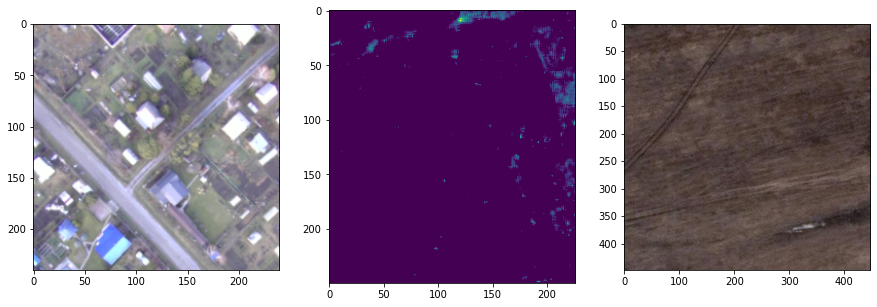

1


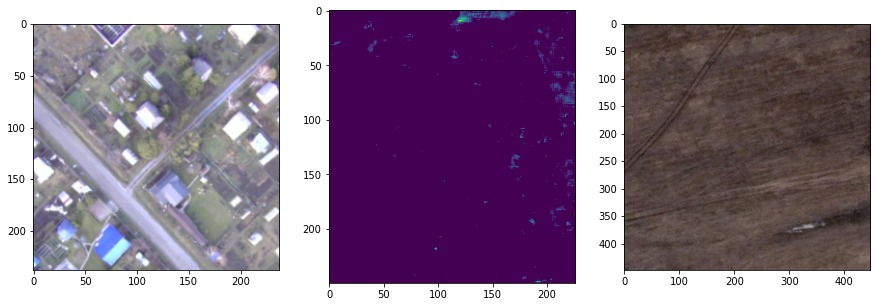

2


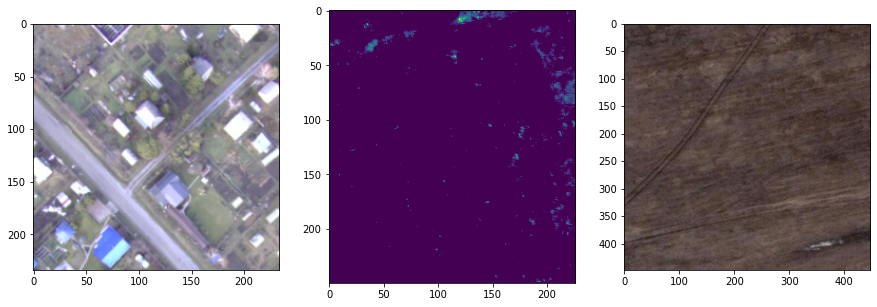

3


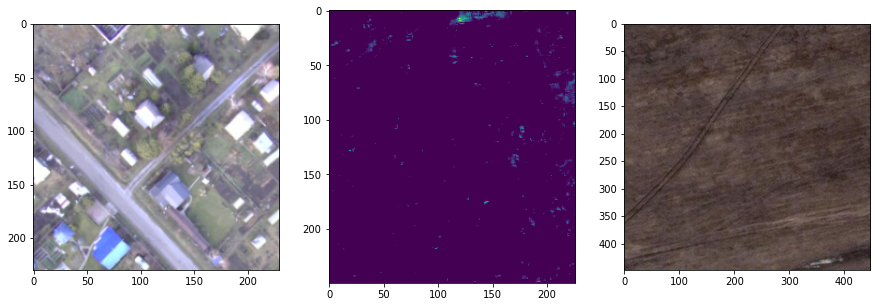

4


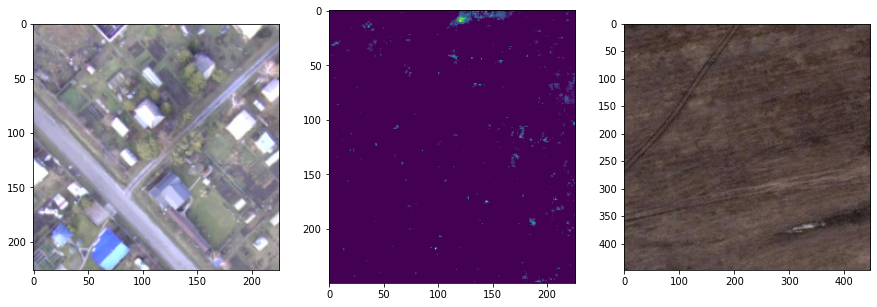

5


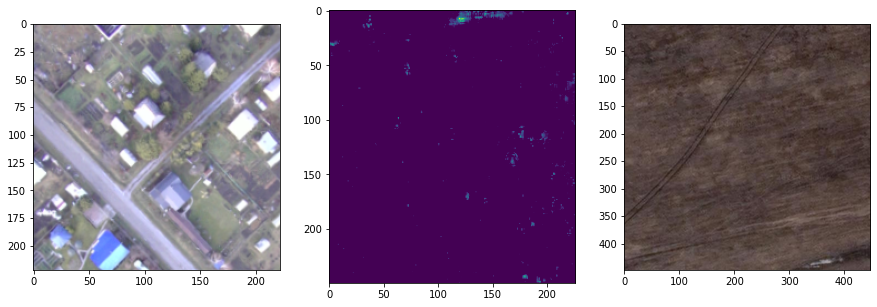

6


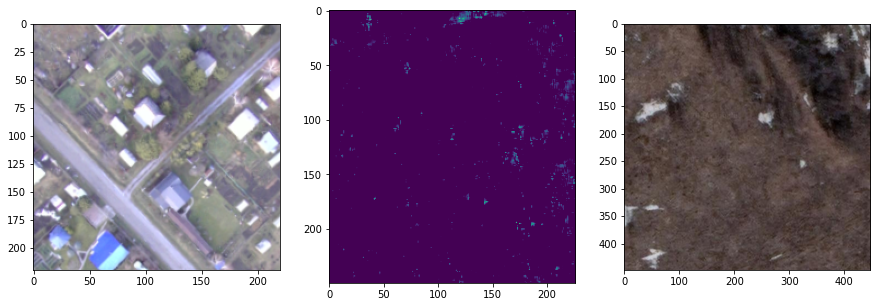

7


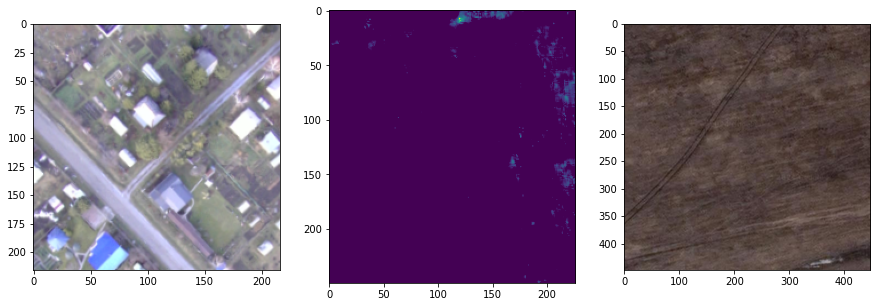

8


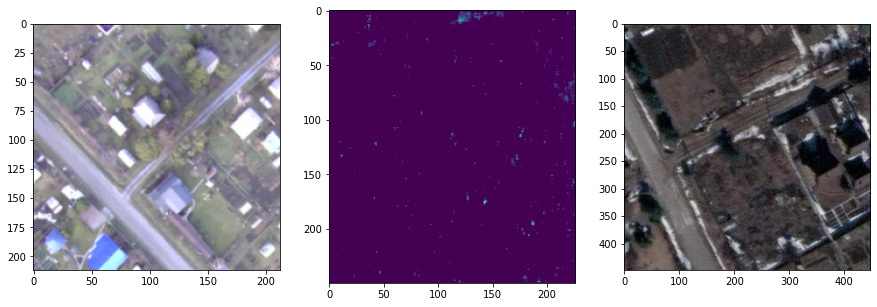

9


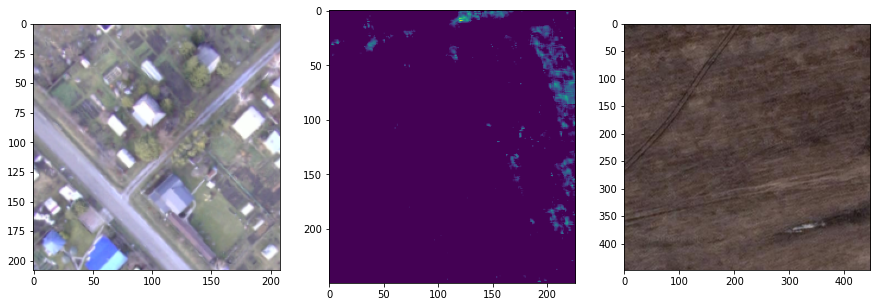

10


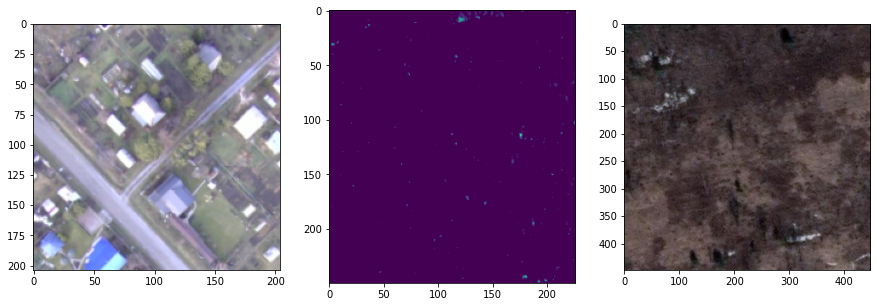

11


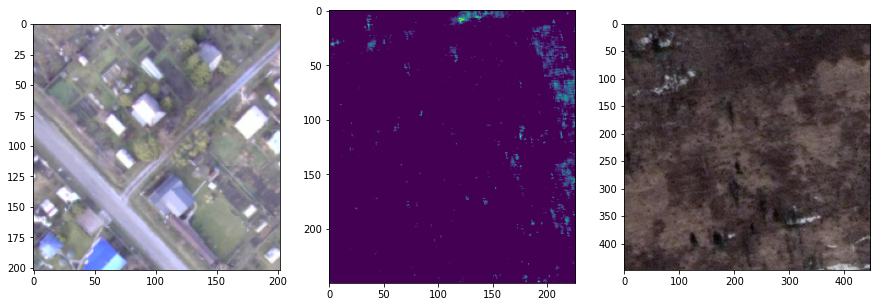

12


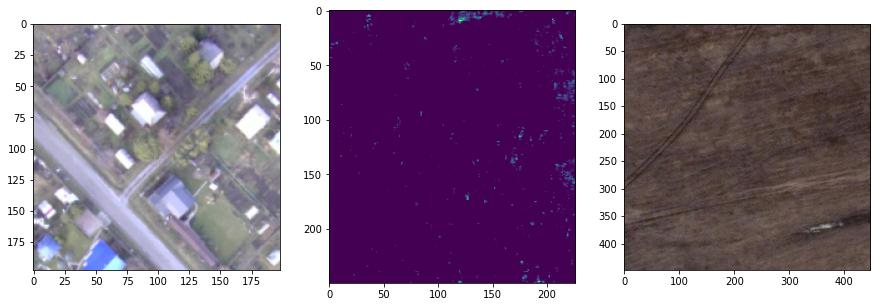

13


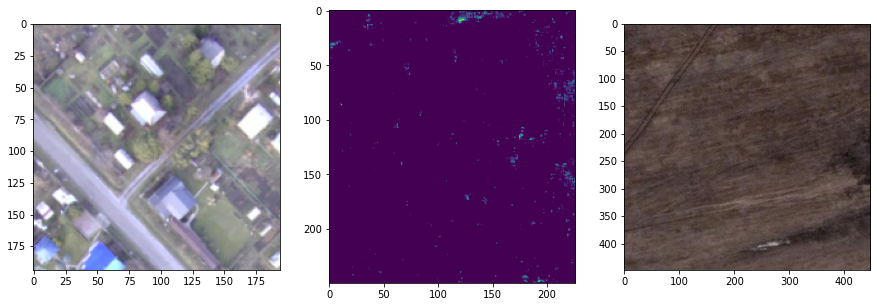

14


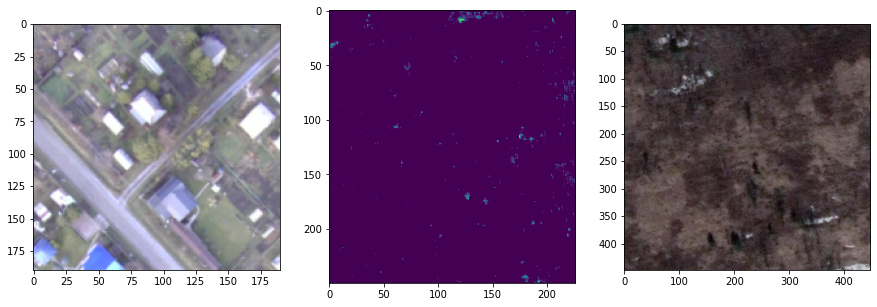

15


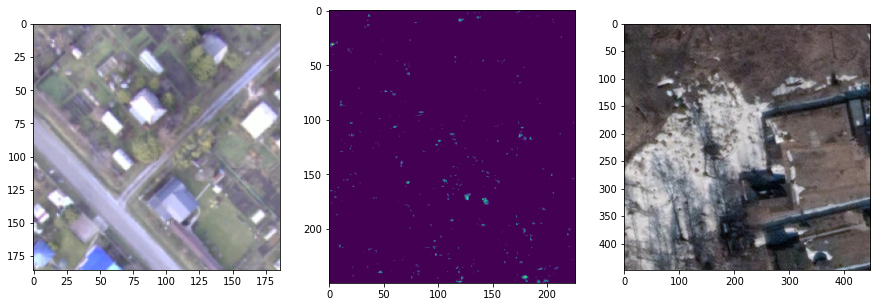

16


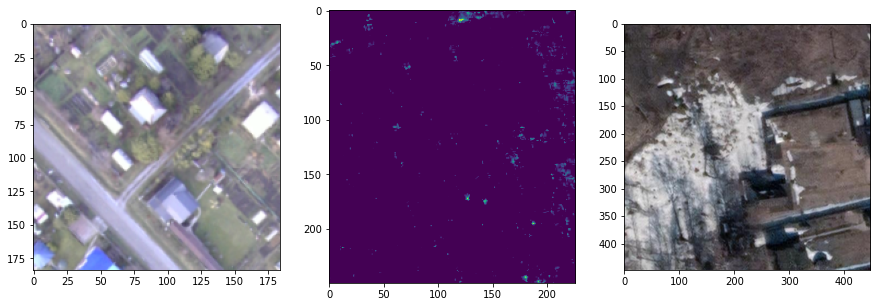

17


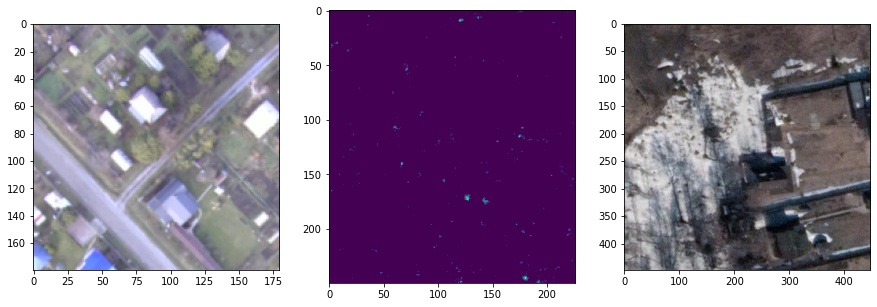

18


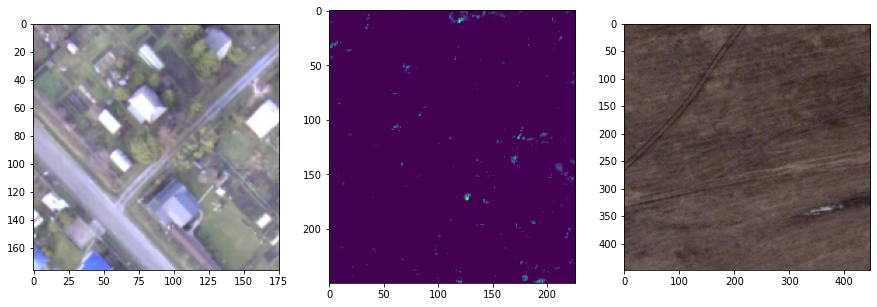

19


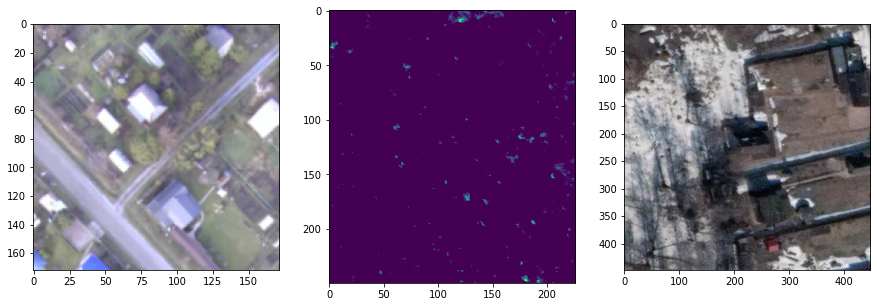

20


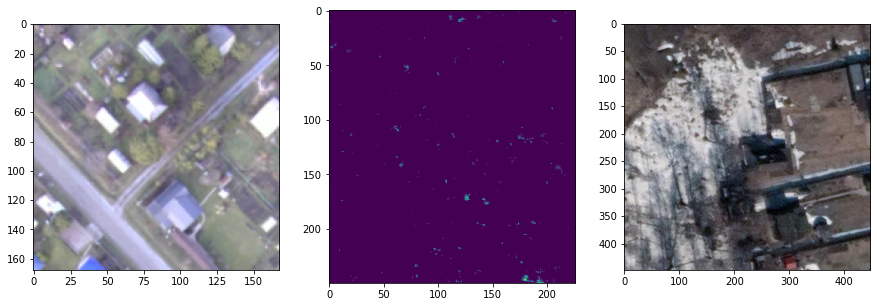

21


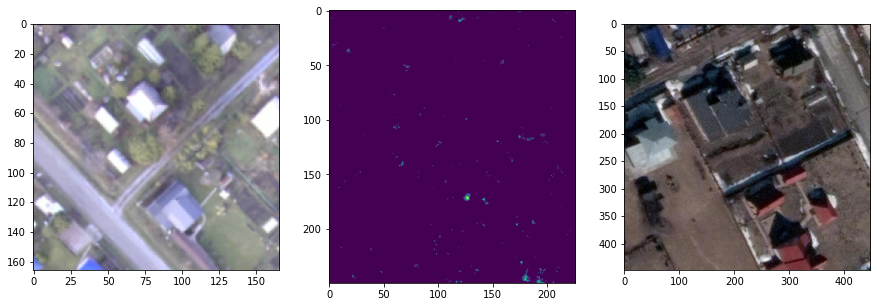

22


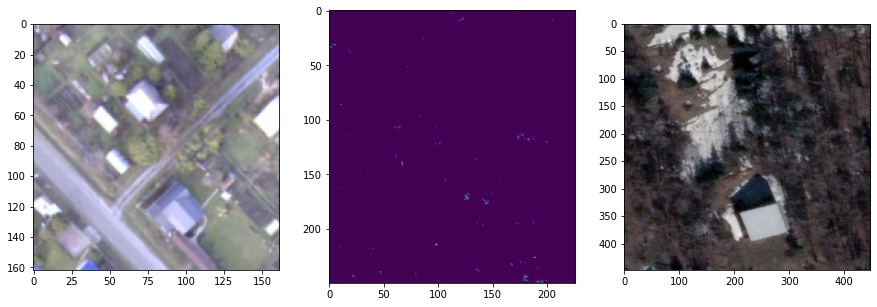

23


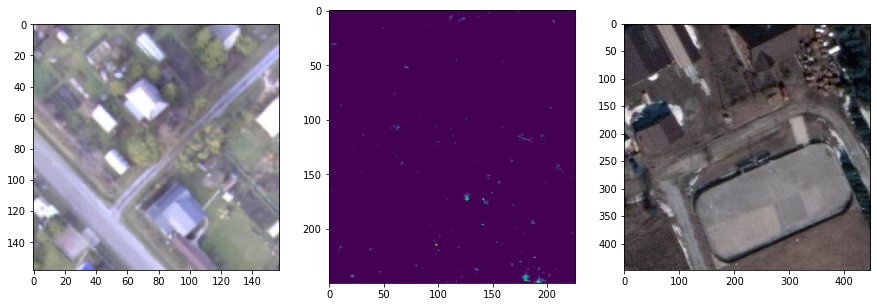

24


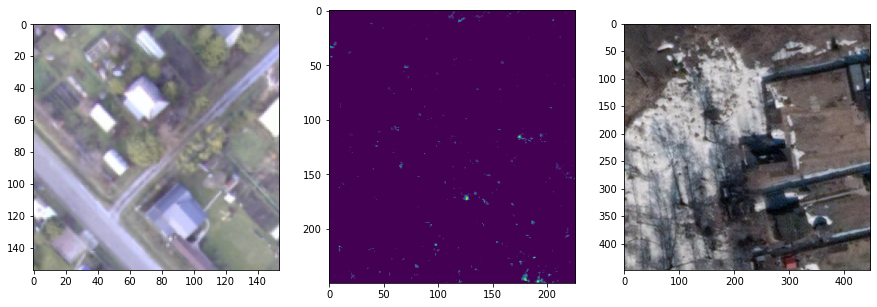

25


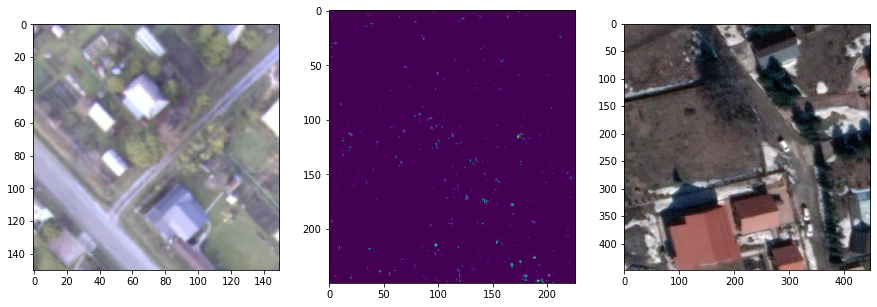

26


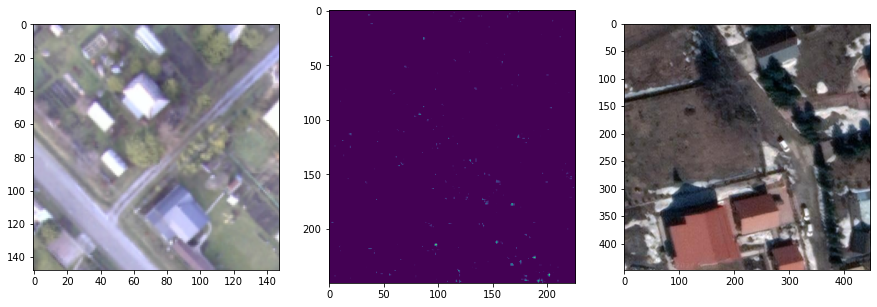

27


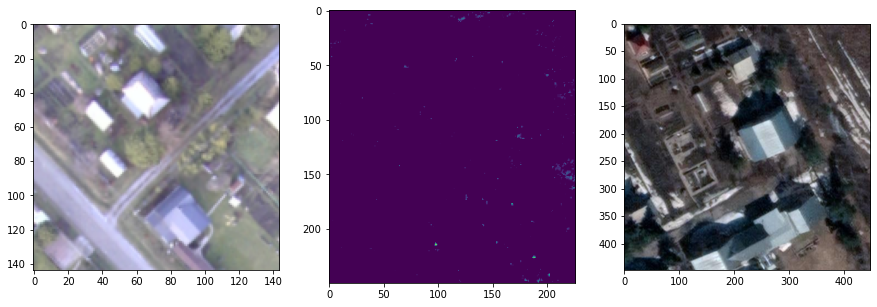

28


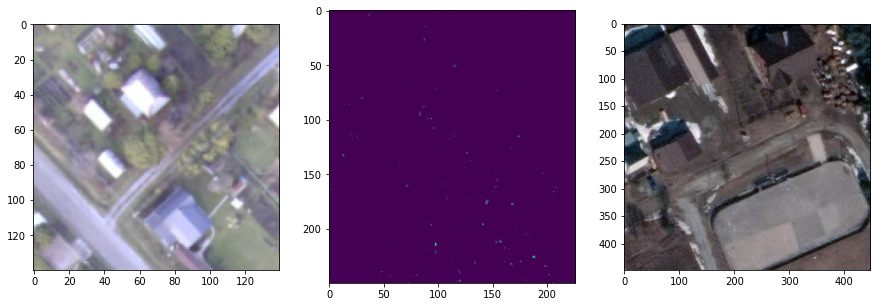

29


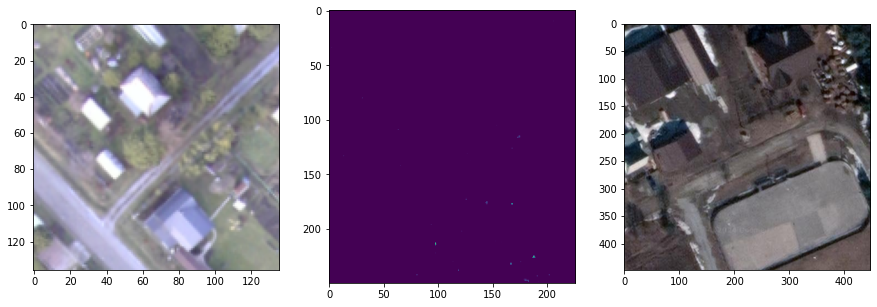

30


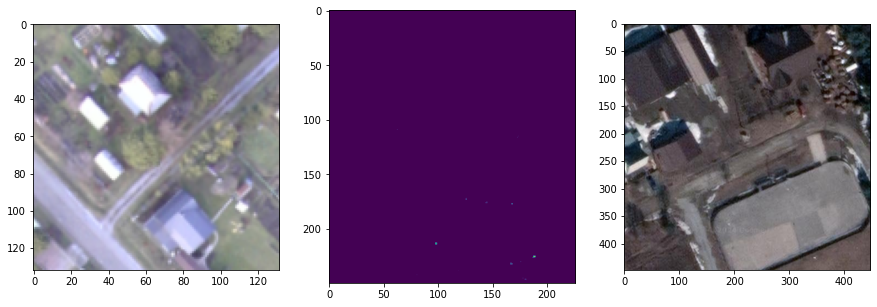

31


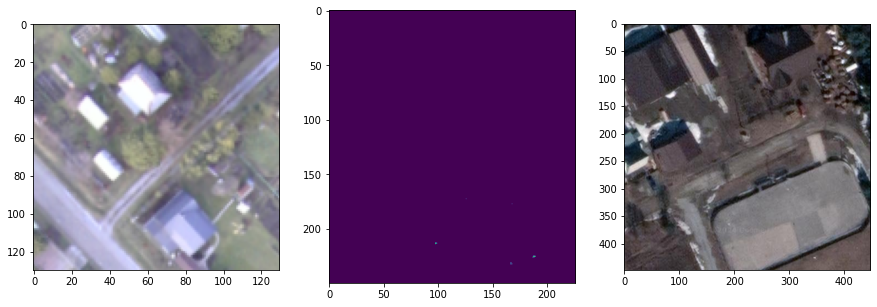

32


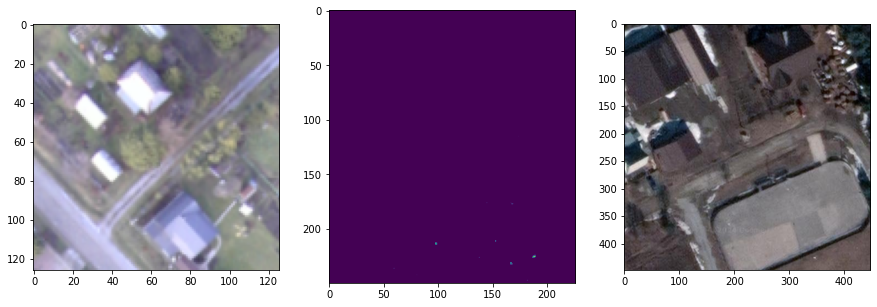

33


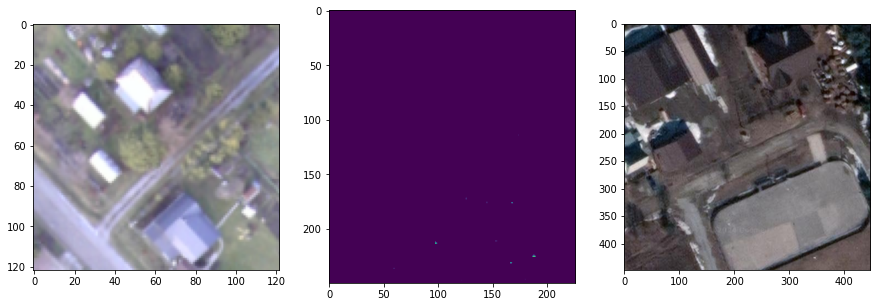

34


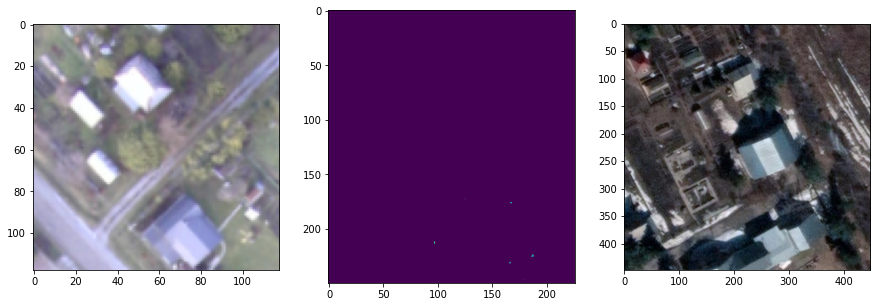

35


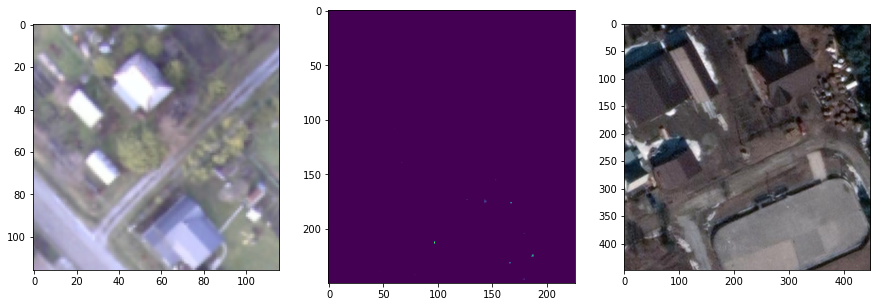

36


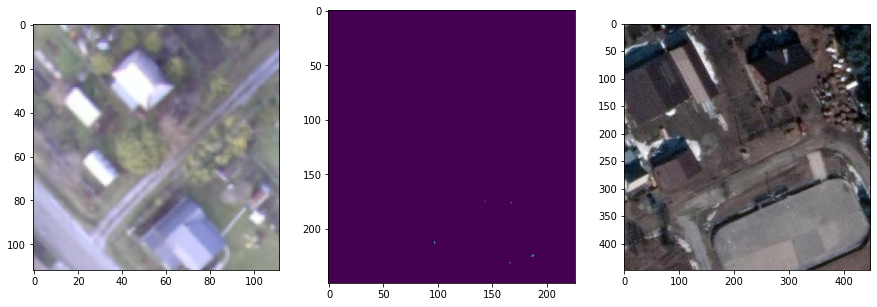

37


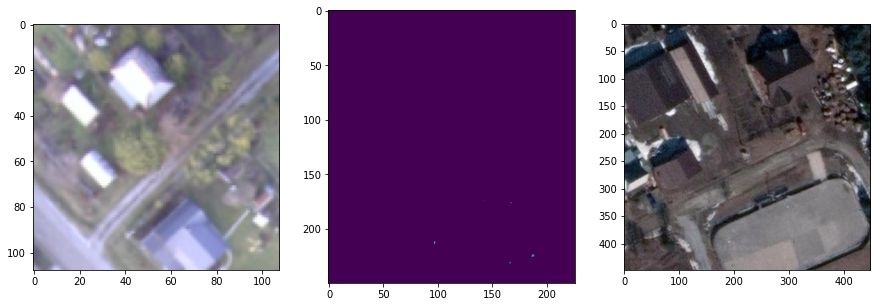

38


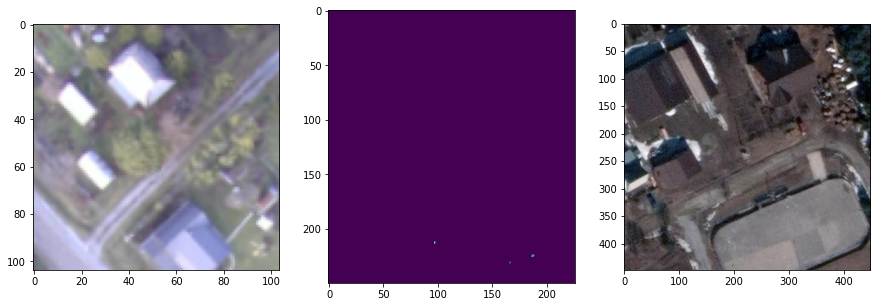

39


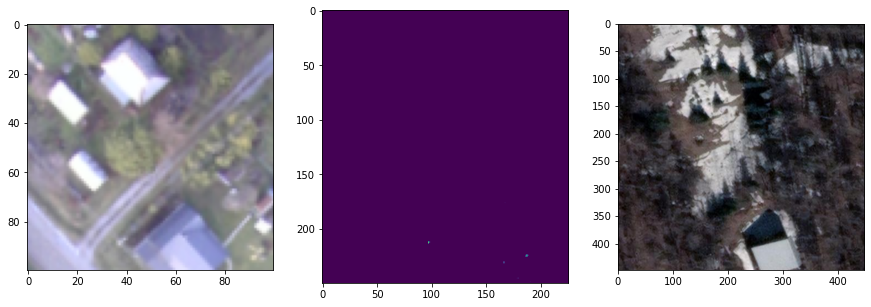

40


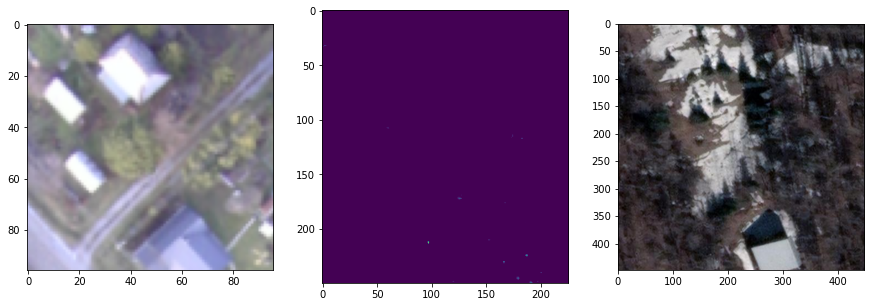

41


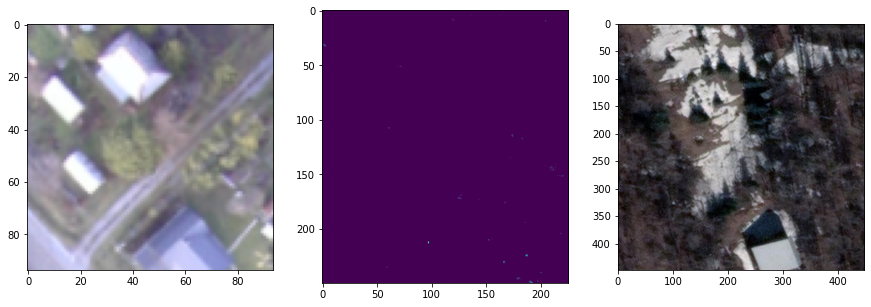

42


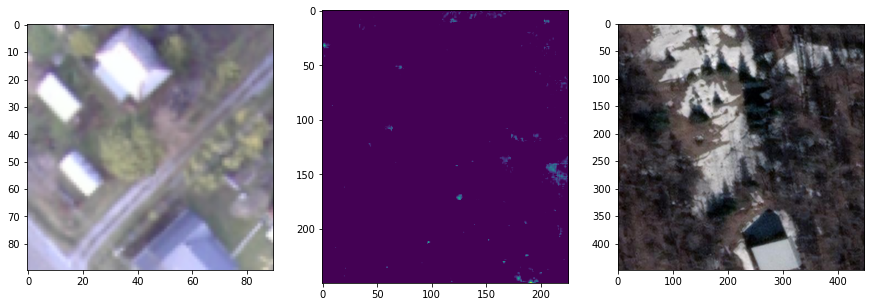

43


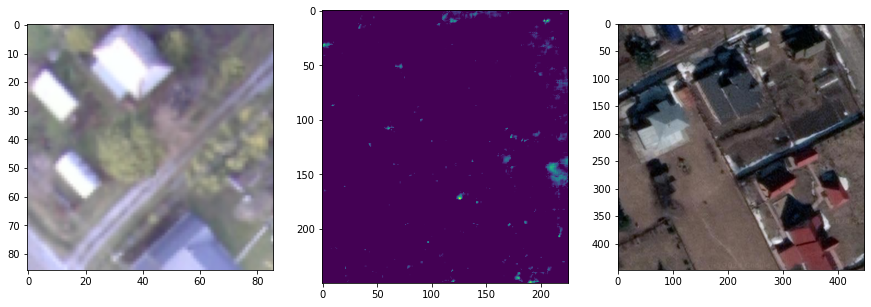

44


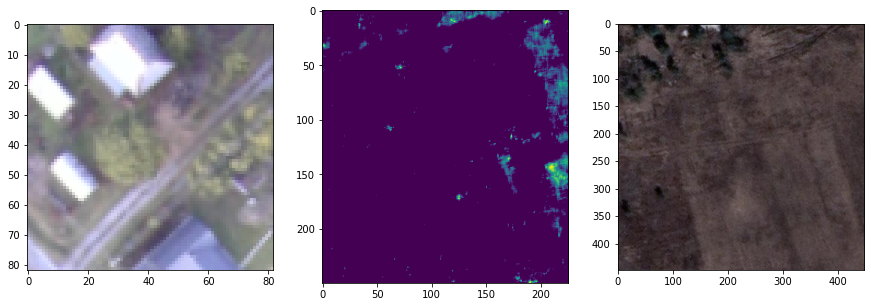

45


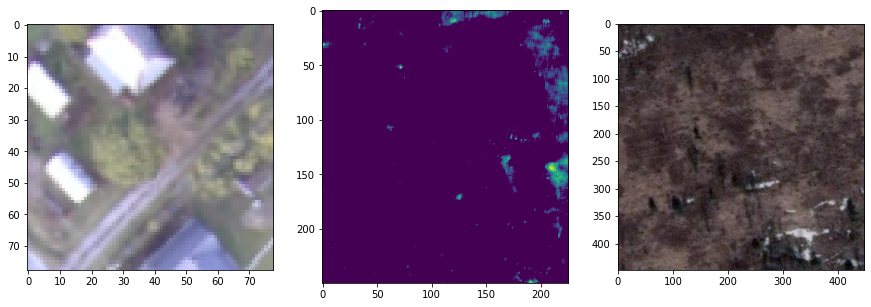

46


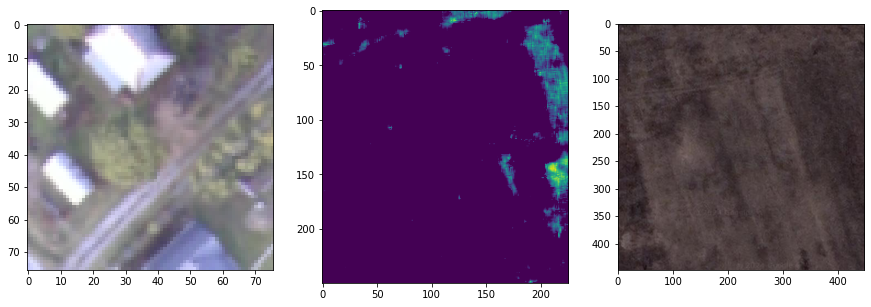

47


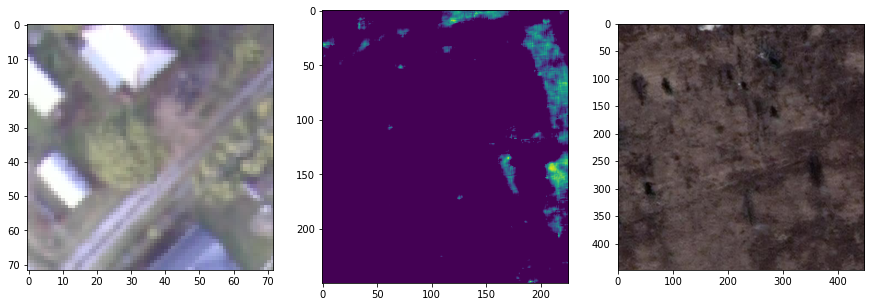

48


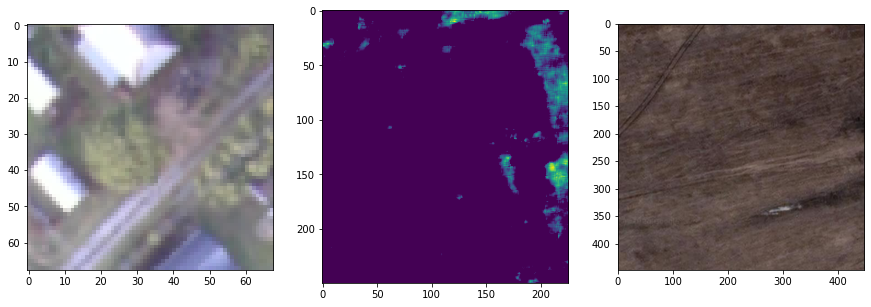

49


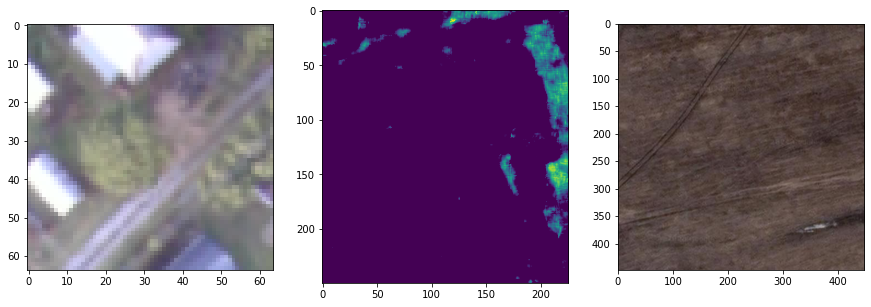

50


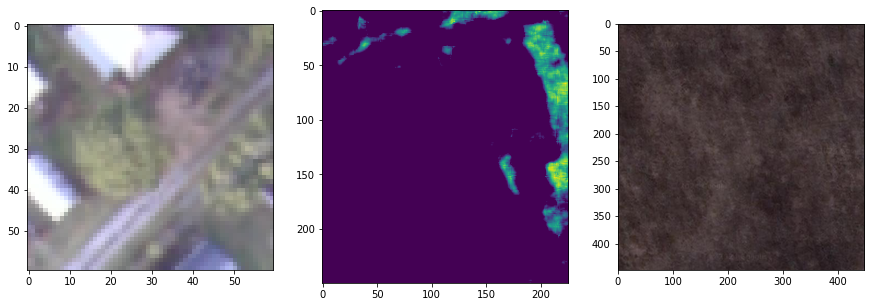

51


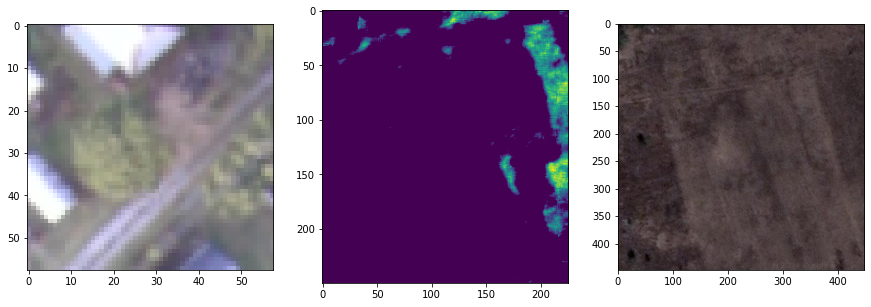

52


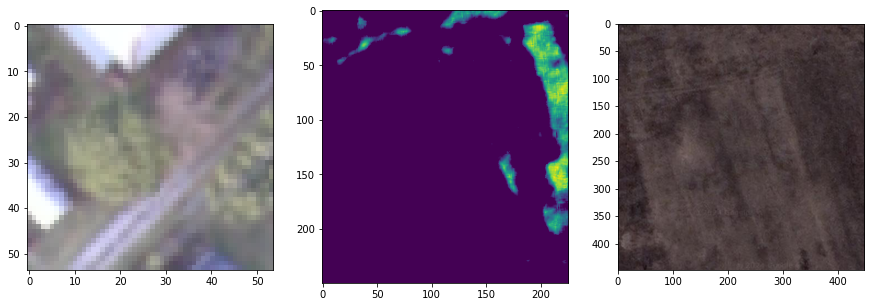

53


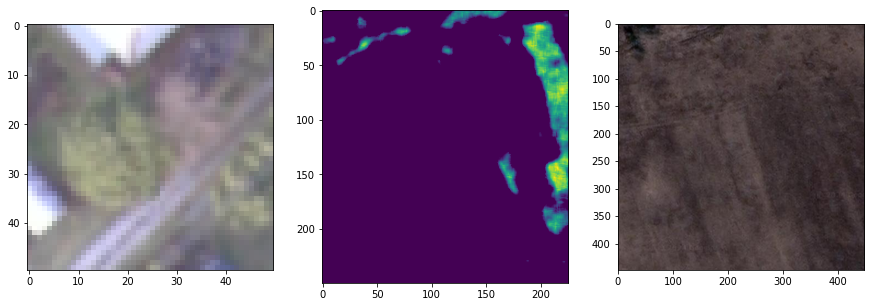

54


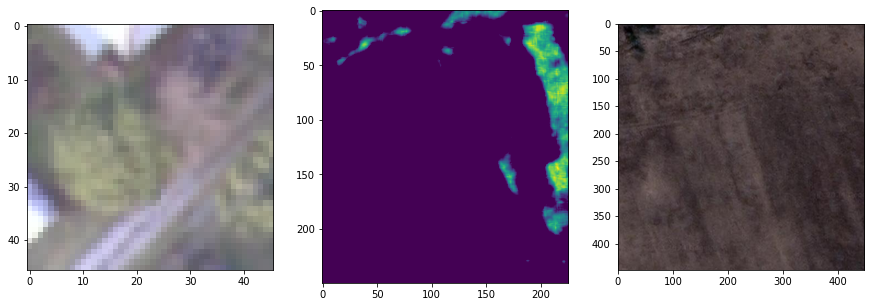

55


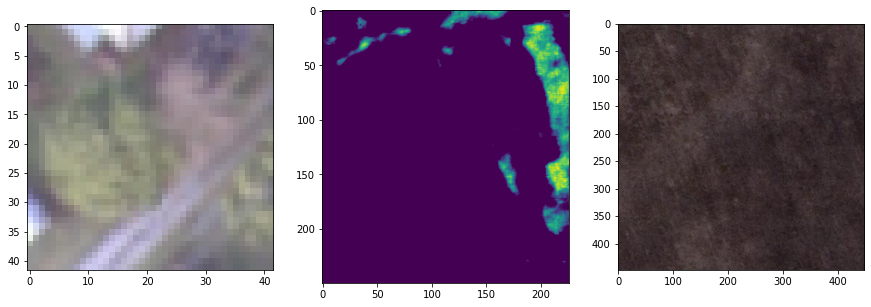

56


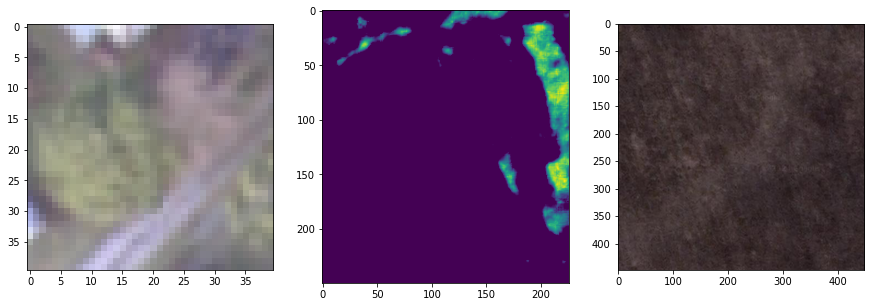

57


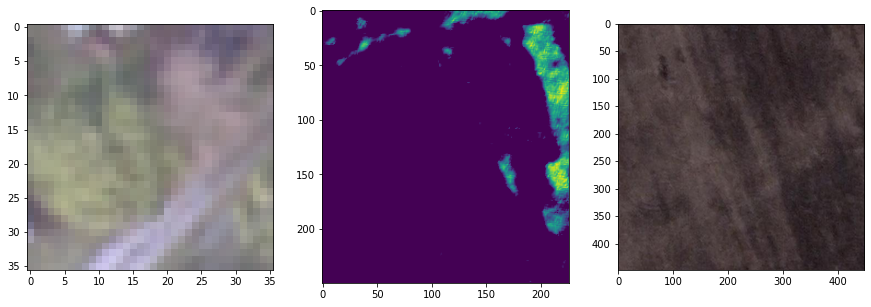

58


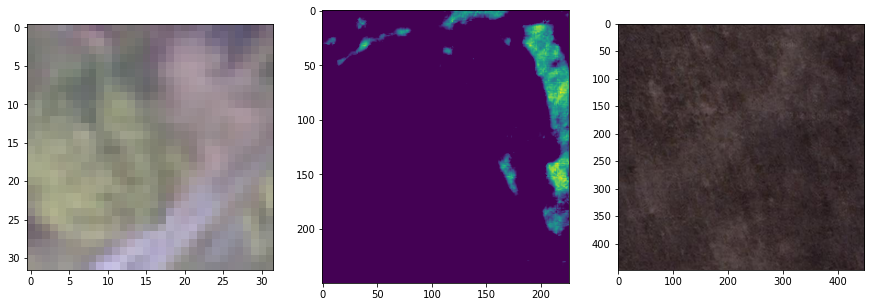

59


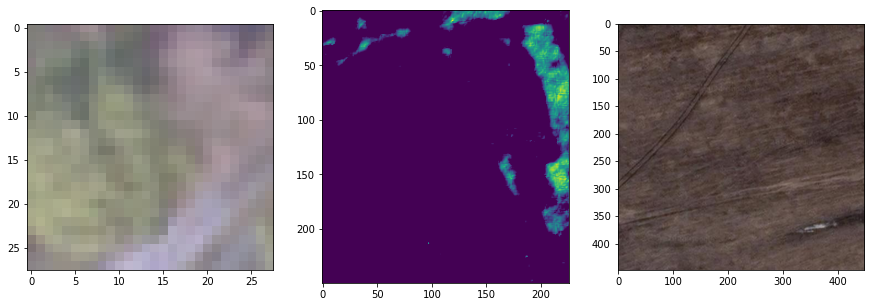

60


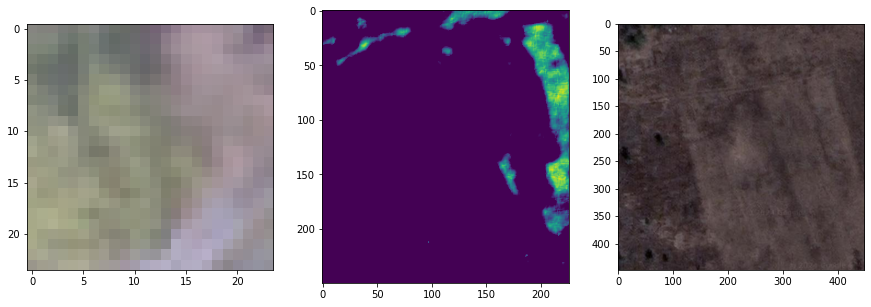

61


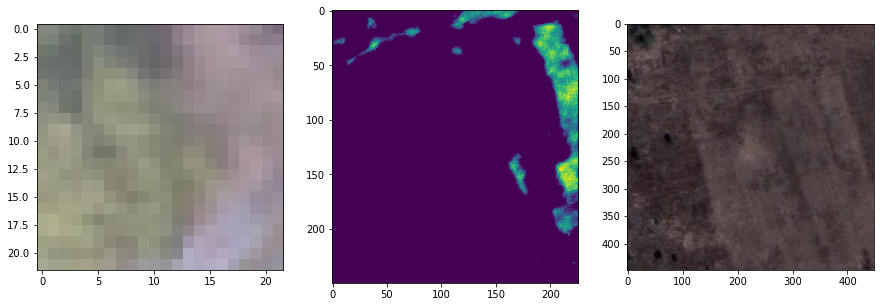

62


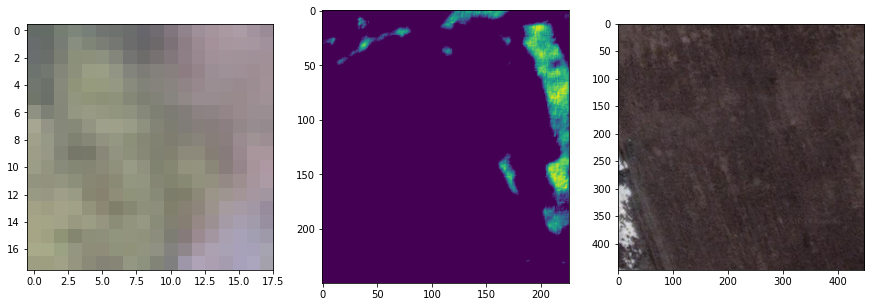

63


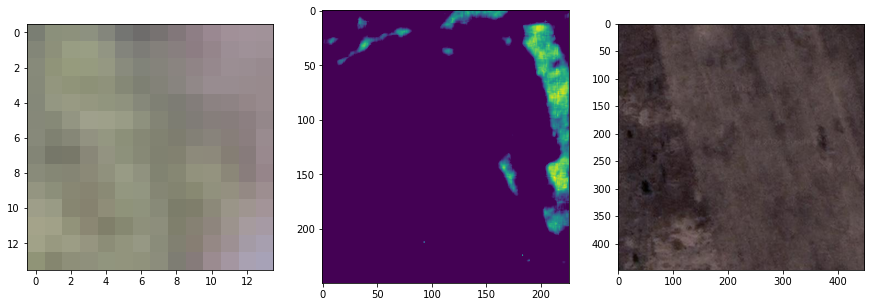

64


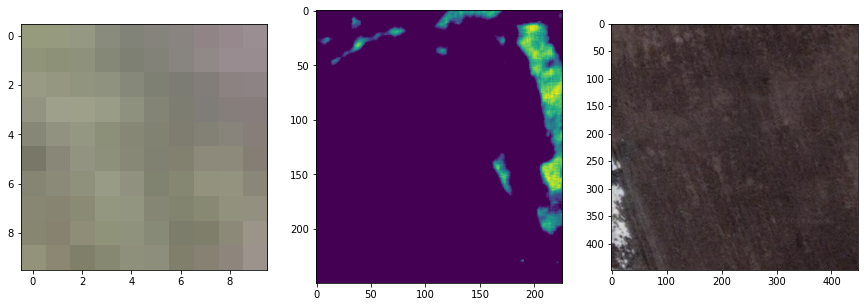

65


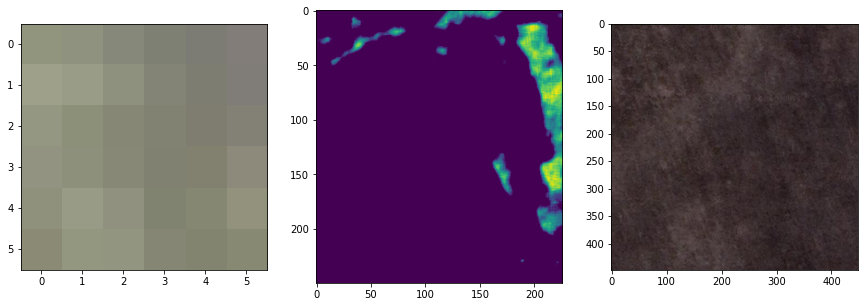

66


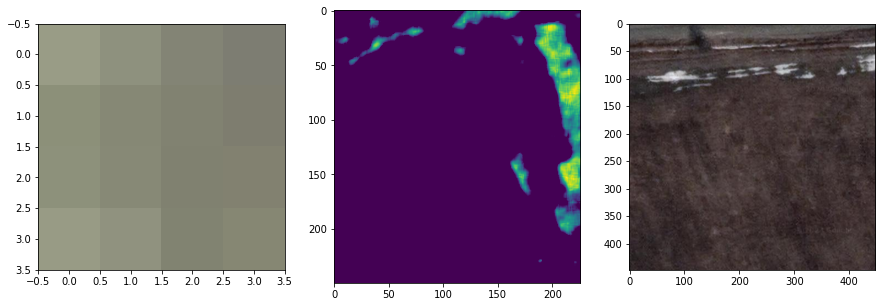

67


error: OpenCV(4.5.5) /io/opencv/modules/imgproc/src/resize.cpp:4052: error: (-215:Assertion failed) !ssize.empty() in function 'resize'


In [3]:

# file_path = os.path.join(source_frames, '1698794700343322184.png')
file_path = os.path.join(source_frames, '1698794738496807349.png')
im = Image.open(file_path)
# crop = np.array(im)
# crop = crop[:,140:500]
metadata = ast.literal_eval(im.info['metadata'])
attitude = metadata['PixHawk_data']['ATTITUDE']
pitch = attitude['pitch']
roll = attitude['roll']
global_position_int = metadata['PixHawk_data']['GLOBAL_POSITION_INT']
relative_alt = global_position_int['relative_alt']/1000
lat = global_position_int['lat']/10**7
lon = global_position_int['lon']/10**7
compass = metadata['PixHawk_data']['VFR_HUD']['heading']

# drone = cv2.cvtColor(np.array(im), cv2.COLOR_BGR2RGB)
drone = np.array(im)

pos = {
    'image': drone,
    'pitch': pitch,
    'roll': roll,
    'yaw': -compass,
#         'heading': compass
}
# height, width = crop.shape[:2]
# rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), -compass, 1.0)
# crop = cv2.warpAffine(crop, rotation_matrix, (width, height), flags=cv2.INTER_LINEAR)
drone = to_orto(pos)
drone = drone[180:420,80:320]
img = cv2.imread(source_map)
img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2RGB)
img_for_crops = img.copy()
for scale in range(98):
    print(scale)
    bias = int((crop.shape[0]/2)*(scale/100))
    inp = drone[0+bias: drone.shape[0]-bias, 0+bias: drone.shape[1]-bias]
    _, hm = main(inp, dron_position)
    
    #     предсказанное изображение
    size = 224
    _, y_x = get_max_idxs(hm)
    pred_y, pred_x = get_pixel(y_x)
    pred_x_map, pred_y_map = pred_x, pred_y
    if pred_x_map < size:
        pred_x_map = size
    if pred_y_map < size:
        pred_y_map = size
    if pred_x_map > img.shape[1]:
        pred_x_map = img.shape[1] - size
    if pred_y_map > img.shape[0]:
        pred_y_map = img.shape[0] - size
    crop_pred = img_for_crops[pred_y_map - size: pred_y_map + size, pred_x_map - size: pred_x_map + size]
    
    fig, axs = plt.subplots(1, 3)
    axs[0].imshow(inp)
    axs[1].imshow(hm)
    axs[2].imshow(crop_pred)
    fig.set_size_inches(15, 10)
    plt.show()
